<a href="https://colab.research.google.com/github/DianaMoyano1/sandbox/blob/master/ImageProcessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load Dependencies

In [18]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io #Supports image processing applications on Python
from PIL import Image 
import matplotlib.pylab as plt

# Read Images from URL
Note: The default input color channels are in BGR format for openCV.

Concatenate vertically: cv2.vconcat()

Concatenate horizontally: cv2.hconcat()

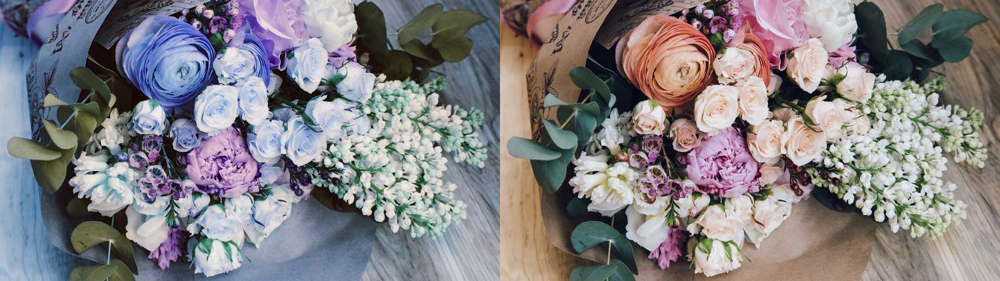

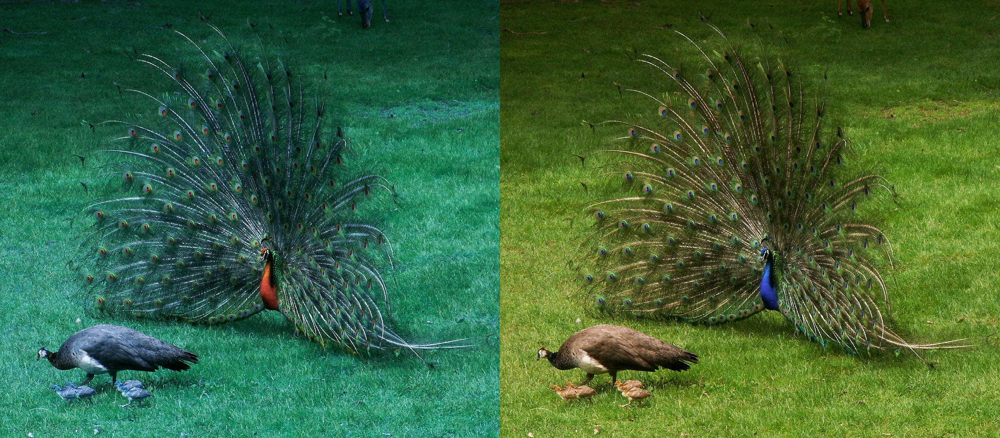

In [19]:
# Create a list to store the urls of the images
urls = ["https://media.timeout.com/images/105645687/750/422/image.jpg",
       "https://images.theconversation.com/files/218711/original/file-20180514-184630-10ec8vv.jpg"]  

for url in urls:
  image = io.imread(url) 
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB) #2nd image changes the order from BRG to RGB
  final_frame = cv.hconcat((image, image_2))
  cv2_imshow(final_frame)
  print('\n') #newline 

In [20]:
# Check the image matrix data type (could know the bit depth of the image)
print(image.dtype)
# Check the height of image 
print(image.shape[0])
# Check the width of image 
print(image.shape[1])
# Check the number of channels of the image
print(image.shape[2])

uint8
898
1024
3


A uint8 data type contains all whole numbers from 0 to 255. As with all unsigned numbers, the values must be non-negative. Uint8's are mostly used in graphics (colors are always non-negative).



## Histograms and Contours
### Generate histogram of color and grayscale image

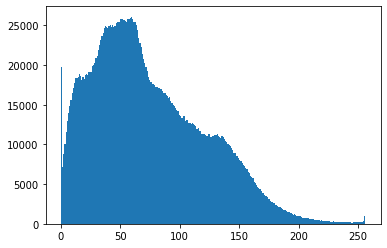

In [21]:
plt.hist(image.ravel(),bins = 256, range = [0,256]) 
plt.show()

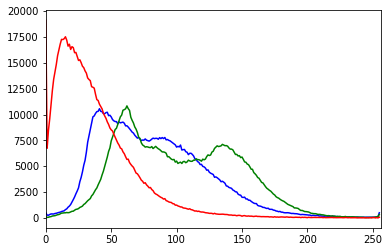

In [22]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv.calcHist([image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

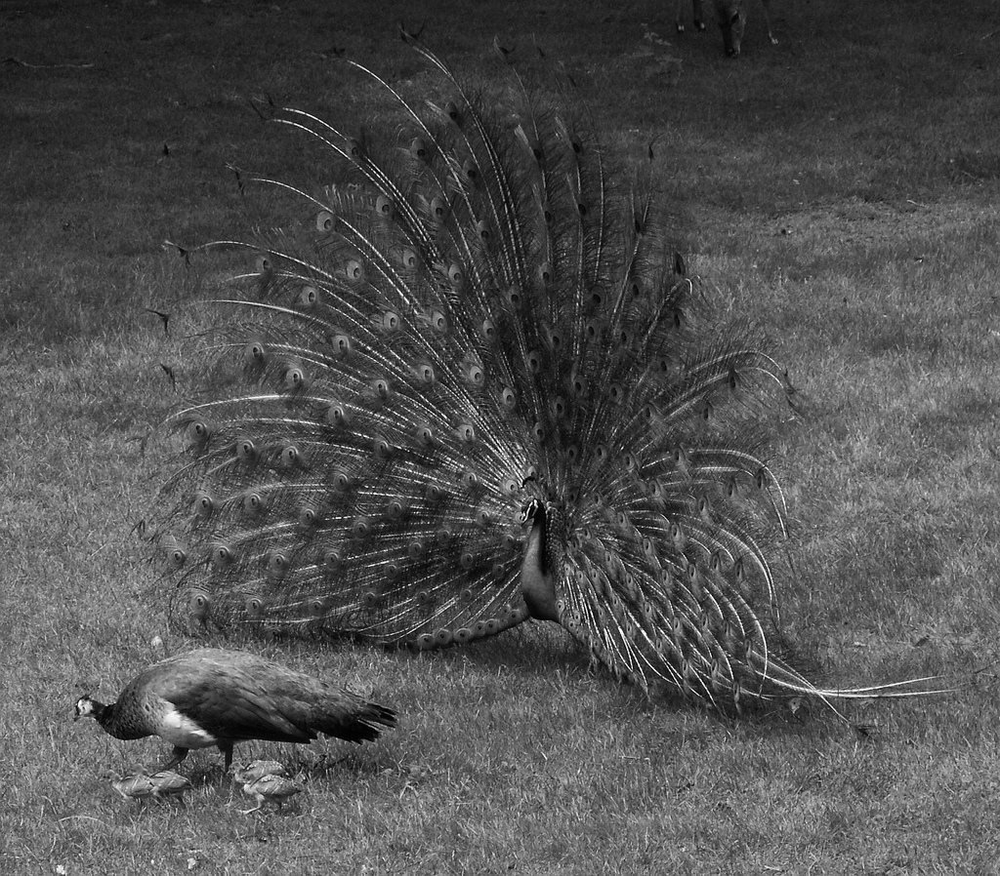

In [23]:
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

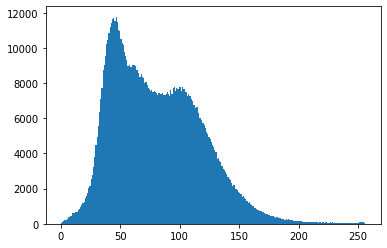

In [24]:
plt.hist(gray_image.ravel(),bins = 256, range = [0, 256])
plt.show()
# the image hist has decreased compared to color image

## Find a contour
Structural outlines of objects in an image which in turn can help us identify shape of the object

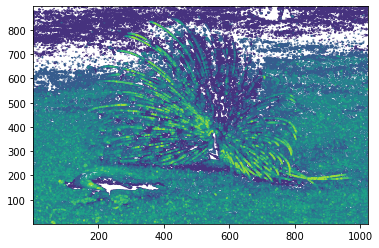

In [25]:
#with Matplot
plt.contour(gray_image, origin = "image")

## Grayscale transform

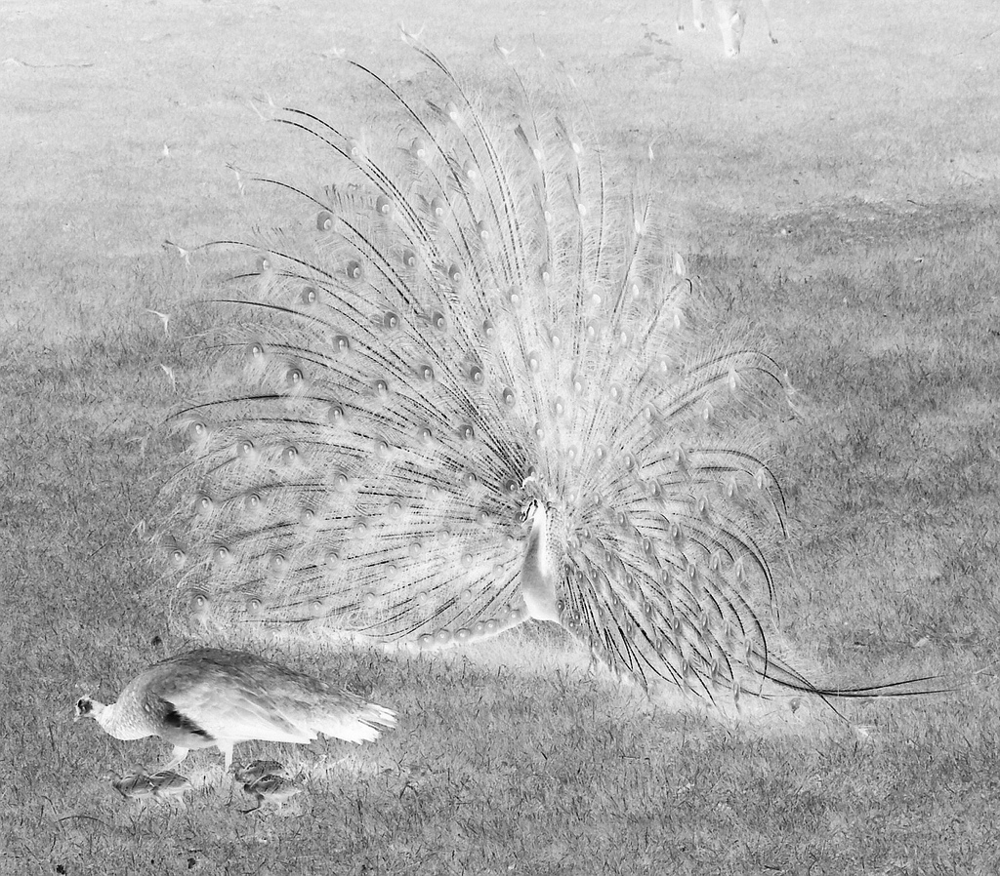

In [27]:
im2 = 255 - gray_image #dark pixels become brigth and viceversa
cv2_imshow(im2)

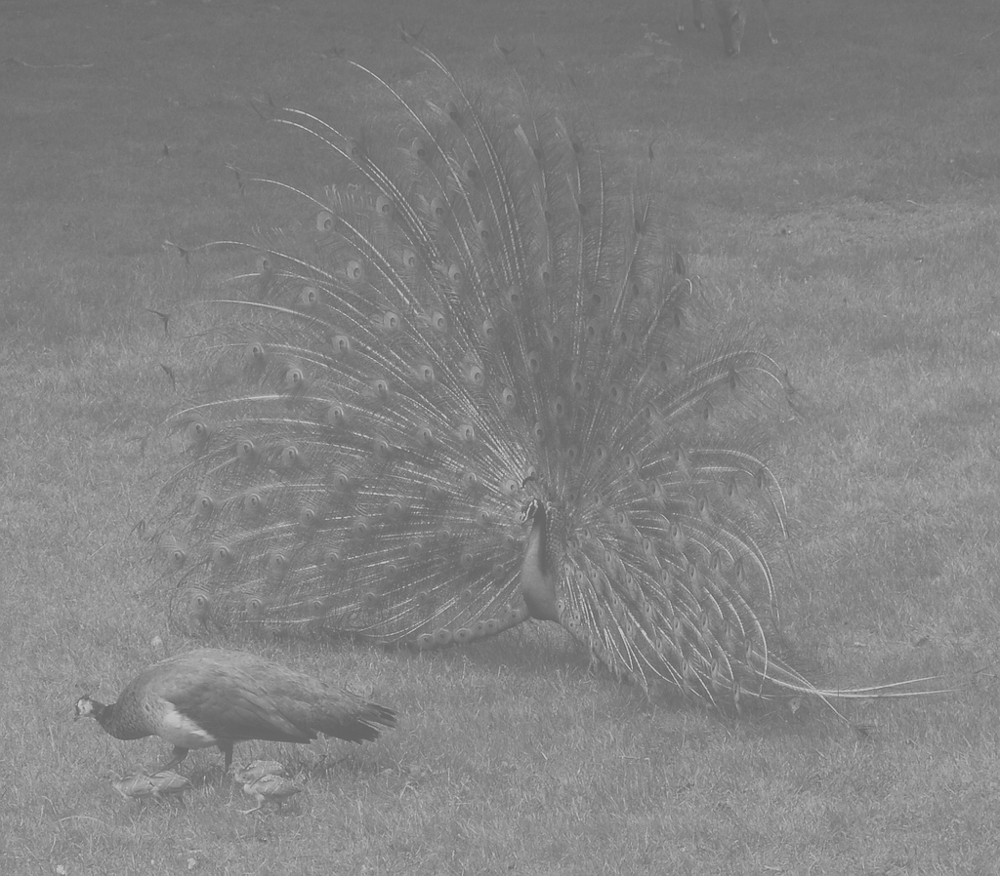

In [28]:
im3 = (100.0/255)*gray_image + 100 #All pixels become brighter
cv2_imshow(im3)

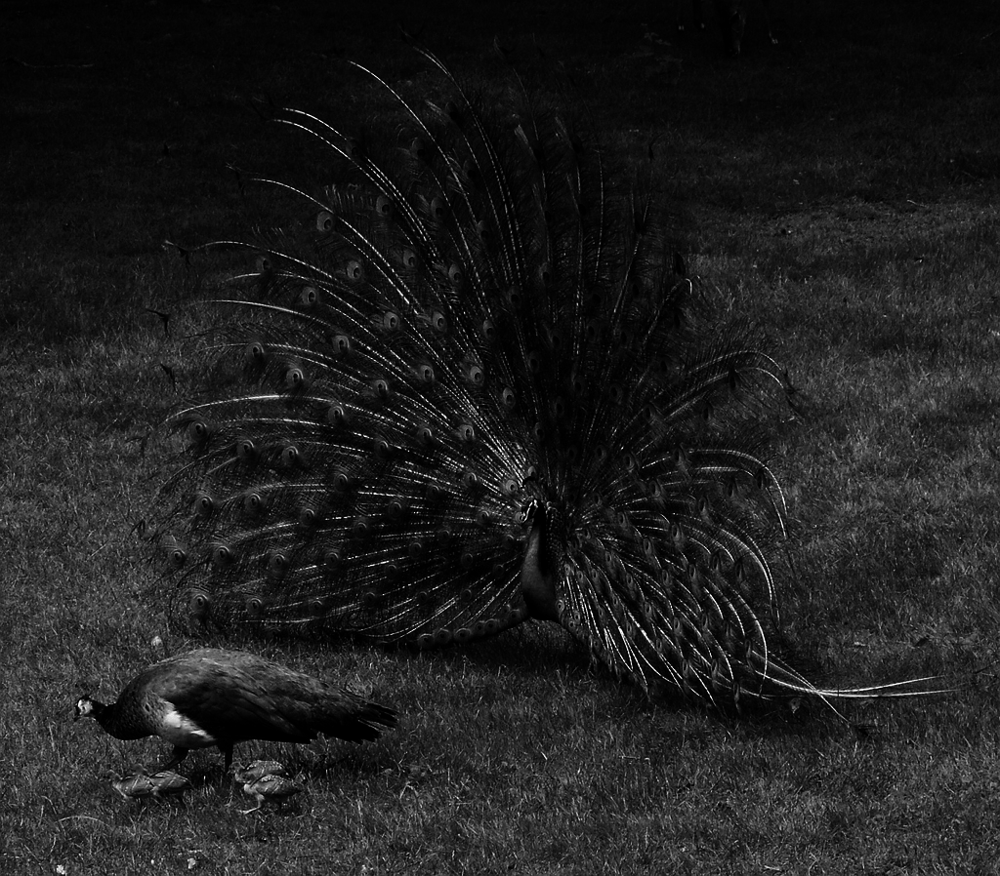

In [29]:
im4 = 255.0*(gray_image/255.0)**2 #lower brightness
cv2_imshow(im4)

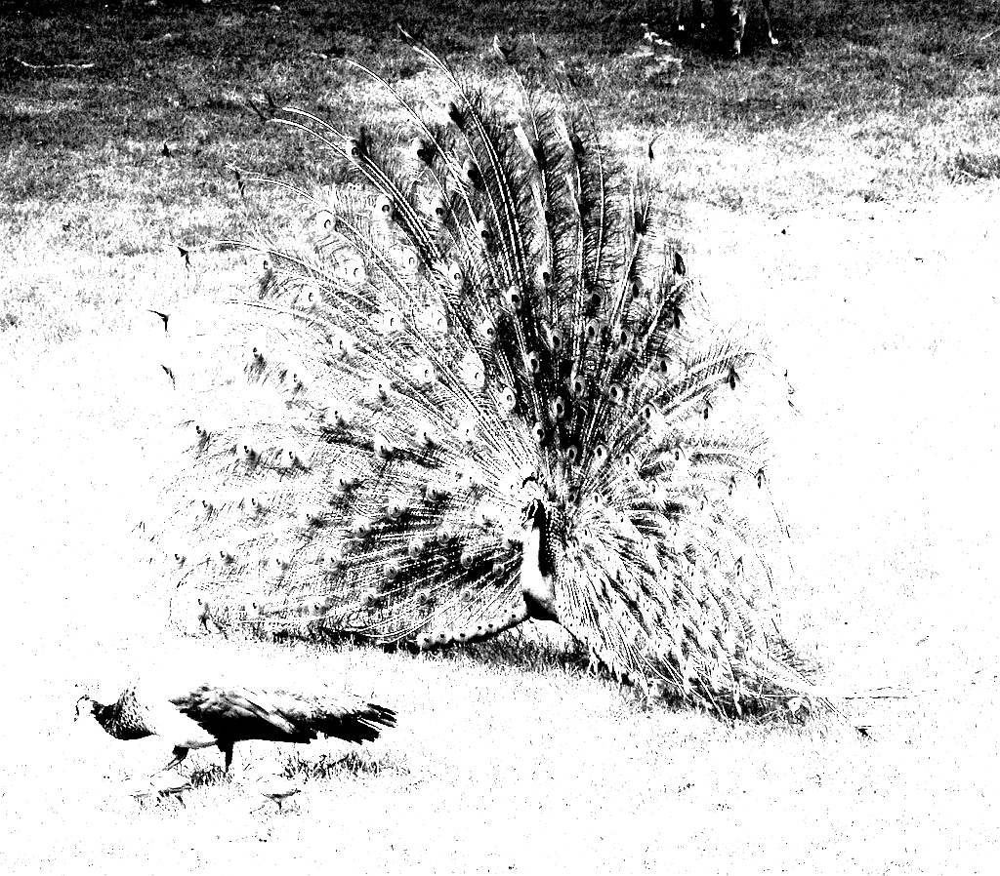

In [44]:
im5 = (2000/255)*gray_image-250
cv2_imshow(im5)

## Fourier Transform

Signal smapled in 2 directions (X and Y) to get the frequency representation of an image. 

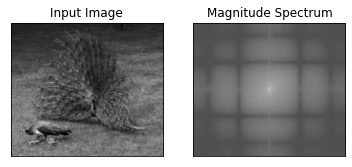

In [45]:
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur = cv.blur(gray_image,(5,5))
# Transform the image to frequency domain
f = np.fft.fft2(imBlur)
# Bring the zero-frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

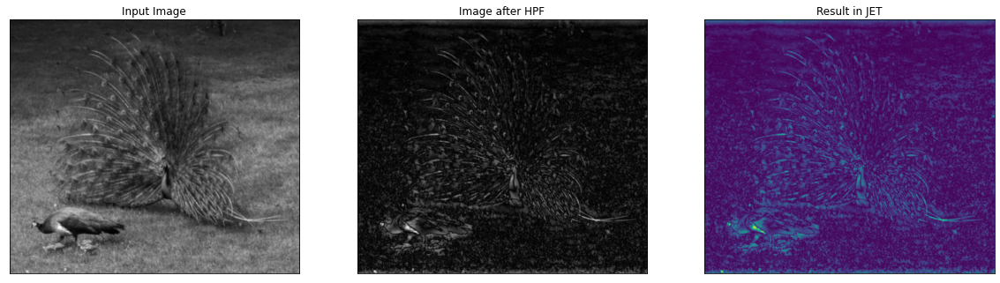

In [46]:
rows, cols = imBlur.shape
crow,ccol = round(rows/2) , round(cols/2)
# remove low frequencies with a rectangle size of 10
fshift[crow-10:crow+10, ccol-10:ccol+10] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plt.figure(figsize=([20, 20]))
plt.subplot(131),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back)
plt.title('Result in JET'), plt.xticks([]), plt.yticks([])
plt.show()